In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import ticker
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

from scipy.stats import zscore
from sklearn.impute import KNNImputer
from scipy.spatial import distance
from scipy.interpolate import interp1d
from scipy import stats
from scipy.stats import chi2
from scipy.spatial.distance import mahalanobis

In [2]:
from pathlib import Path
print(Path.cwd())

from os import walk

#This is the folder path, replace to your own local path
dir_path = r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Sang_Code_Processing_2024\0. Raw data\Year 4Final\Desigo\Zone relative humidity'

file_list = []
for (dir_path, dir_names, file_names) in walk(dir_path):
    file_list.extend(file_names)
    # don't look inside any subdirectory
    break
print(file_list)

c:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Code Year4
['HZ_Z11_RH_060123-053124_raw.csv', 'HZ_Z12+13_RH_060123-053124_raw.csv', 'HZ_Z15+16_RH_060123-053124_raw.csv', 'HZ_Z17_RH_060123-053124_raw.csv', 'HZ_Z1_RH_060123-053124_raw.csv', 'HZ_Z21_RH_060123-053124_raw.csv', 'HZ_Z22+23_RH_060123-053124_raw.csv', 'HZ_Z24_RH_060123-053124_raw.csv', 'HZ_Z25+26+27_RH_060123-053124_raw.csv', 'HZ_Z31_RH_060123-053124_raw.csv', 'HZ_Z32_RH_060123-053124_raw.csv', 'HZ_Z33_RH_060123-053124_raw.csv', 'HZ_Z3_RH_060123-053124_raw.csv', 'HZ_Z4_RH_060123-053124_raw.csv', 'HZ_Z5_RH_060123-053124_raw.csv']


In [3]:
# IMPORTANT: If you get an error in reading the files do the following:
import os
Lst = []
for i in range(0, len(file_list)):
    # Construct the full path for each file
    file_path = os.path.join(dir_path, file_list[i])
    # Use the full path to read the CSV file
    data = pd.read_csv(file_path, parse_dates=['Timestamp'], index_col=[0])
    filtered_df = data[data['QualityGood'] == True]
    print(len(filtered_df))
    Lst.append(filtered_df)

527276
527277
527275
527277
527277
527277
527277
527276
527274
527276
527274
527275
527275
527276
527276


In [4]:
Lst_RH = []
Lst_name = []
#Initialize an empty DataFrame to compile resampled data from each DataFrame in Lst
Zone_RH = pd.DataFrame()
res = 1
#This part will take care of timestamp corrections, ensuring the output is always EST!
for i in range(0,len(Lst)):
    #Convert the index of the current DataFrame to datetime format with UTC timezone
    Lst[i].index = pd.to_datetime(Lst[i].index, errors='coerce', utc=True, format='mixed')
    #Convert the timezone of the index from UTC to US/Eastern
    Lst[i].index = Lst[i].index.tz_convert('US/Eastern')
    #Resample the DataFrame to a 1-minute frequency using the mean for aggregation. (This is for analysis)
    #forward fill missing data resulting from the resampling.
    Lst[i] = Lst[i].resample("1T").mean().ffill()
    #Extract the name of the first column of the DataFrame.    
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    #Convert the specified column's data to numeric to ensure consistency for calculations.
    Z = pd.to_numeric(Lst[i][zone_name])
    Lst_RH.append(Z.tolist())
    #Create a new column in 'Zone_RH' with the name of the current zone.
    Zone_RH[zone_name] = pd.Series(Z, index=Lst[i].index)
    
Zone_RH

C:\Users\Sang\AppData\Local\Temp\ipykernel_25900\2866160066.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_25900\2866160066.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_25900\2866160066.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_25900\2866160066.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  Lst[i] = Lst[i].resample("1T").mean().ffill()
C:\Users\Sang\AppData\Local\Temp\ipykernel_25900\2866160066.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version,

,Z11_RH (%),Z12+13_RH (%),Z15+16_RH (%),Z17_RH (%),Z1_RH (%),Z21_RH (%),Z22+23_RH (%),Z24_RH (%),Z25+26+27_RH (%),Z31_RH (%),Z32_RH (%),Z33_RH (%),Z3_RH (%),Z4_RH (%),Z5_RH (%)
Timestamp,,,,,,,,,,,,,,,
2023-06-01 00:00:00-04:00,44.360001,39.639999,34.619999,35.240002,40.959999,44.000000,41.32,35.139999,42.959999,33.380001,32.320000,35.639999,35.820000,36.82,39.360001
2023-06-01 00:01:00-04:00,44.360001,39.639999,34.619999,35.240002,40.959999,44.000000,41.32,35.139999,42.959999,33.380001,32.320000,35.639999,35.820000,36.82,39.360001
2023-06-01 00:02:00-04:00,44.360001,39.639999,34.619999,35.240002,40.959999,44.000000,41.32,35.139999,42.959999,33.380001,32.320000,35.639999,35.820000,36.82,39.360001
2023-06-01 00:03:00-04:00,44.360001,39.639999,34.619999,35.240002,40.959999,44.000000,41.32,35.139999,42.959999,33.380001,32.320000,35.639999,35.820000,36.82,39.360001
2023-06-01 00:04:00-04:00,44.360001,39.639999,34.619999,35.240002,40.959999,44.000000,41.32,35.139999,42.959999,33.040001,32.320000,35.639999,35.820000,36.82,39.360001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-31 23:55:00-04:00,37.560001,40.099998,43.840000,43.439999,40.380001,37.400002,36.52,36.540001,37.880001,39.320000,40.340000,37.900002,43.400002,46.00,50.080002
2024-05-31 23:56:00-04:00,37.560001,40.099998,43.840000,43.439999,40.380001,37.400002,36.52,36.540001,37.880001,39.320000,40.340000,37.900002,43.400002,46.00,50.080002
2024-05-31 23:57:00-04:00,37.560001,40.099998,43.840000,43.439999,40.380001,37.400002,36.52,36.540001,37.880001,39.320000,40.340000,37.900002,43.400002,44.00,50.080002


<Axes: xlabel='Timestamp'>

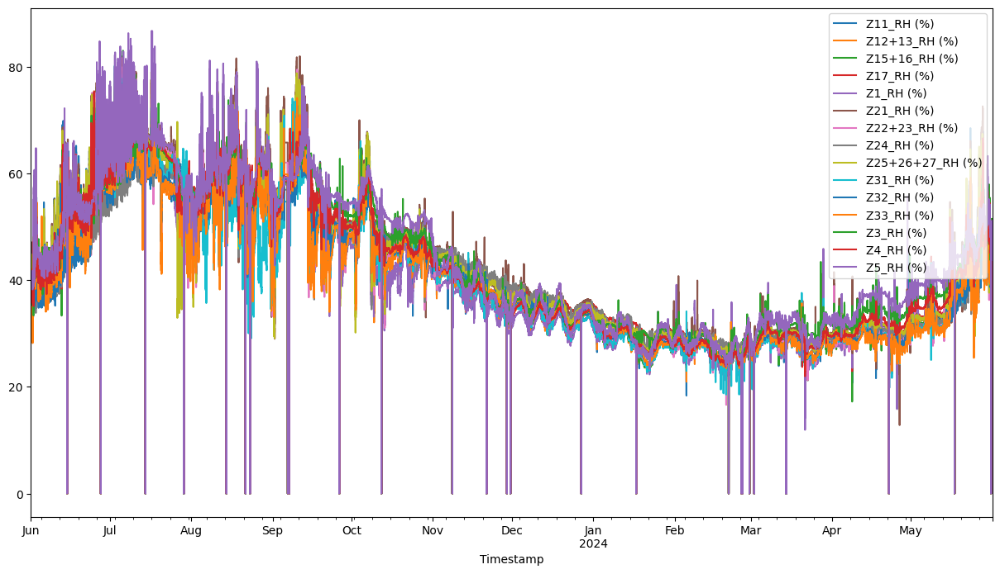

In [5]:
Zone_RH.plot(figsize=(15, 8))

In [6]:
#Initialize lists for storing differences and names (Difference Analysis)
Lst_diff = []
Lst_name = []
#Loop through each DataFrame to calculate and store differences in data.
for i in range(0,len(Lst)):
    zone_name = Lst[i].columns.values[0]
    Lst_name.append(zone_name)
    Z = pd.to_numeric(Lst[i][zone_name])
    #Calculate the difference between consecutive data points.
    temp = Z.diff()
    #Store the differences, excluding the last one, and sorting to facilitate analysis (1000 most significant differences).
    Lst_diff.append(temp.sort_values(ascending=True)[-1000:-1].tolist())
    
# print (Lst_diff)
#Restructure the dataframe for visual analysis
df = pd.DataFrame(Lst_diff).transpose()

df.columns = Lst_name
df   

,Z11_RH (%),Z12+13_RH (%),Z15+16_RH (%),Z17_RH (%),Z1_RH (%),Z21_RH (%),Z22+23_RH (%),Z24_RH (%),Z25+26+27_RH (%),Z31_RH (%),Z32_RH (%),Z33_RH (%),Z3_RH (%),Z4_RH (%),Z5_RH (%)
0,2.000000,2.000000,2.000000,1.160000,2.000000,4.040001,2.040001,2.080002,2.000000,2.039997,2.000000,1.720001,2.040001,2.040001,2.079998
1,2.000000,2.000000,2.000000,1.160000,2.000000,4.040001,2.040001,2.080002,2.000000,2.039997,2.000000,1.720001,2.040001,2.040001,2.079998
2,2.000000,2.000000,2.000000,1.160000,2.000000,4.040001,2.040001,2.080002,2.000000,2.039997,2.000000,1.720001,2.040001,2.040001,2.079998
3,2.000000,2.000000,2.000000,1.160000,2.000000,4.040001,2.040001,2.080002,2.000000,2.039997,2.000000,1.720001,2.040001,2.040001,2.079998
4,2.000000,2.000000,2.000000,1.160000,2.000000,4.040001,2.040001,2.080002,2.000000,2.039997,2.000000,1.720001,2.040001,2.040001,2.079998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,58.200001,56.880001,58.360001,57.840000,56.520000,59.560001,54.880001,56.200001,58.080002,35.000000,54.680000,48.680000,56.880001,57.160000,58.360001
995,60.119999,57.240002,59.200001,58.599998,56.560001,60.240002,59.000000,56.200001,58.400002,48.959999,55.240002,49.040001,57.160000,58.080002,59.400002
996,60.320000,58.799999,60.320000,59.200001,58.400002,60.560001,59.160000,57.000000,58.880001,54.680000,56.200001,56.200001,60.240002,59.720001,61.360001
997,60.959999,62.880001,60.480000,60.840000,60.720001,65.279999,64.160004,57.680000,61.160000,56.520000,58.320000,58.160000,60.279999,59.720001,62.560001


<Axes: >

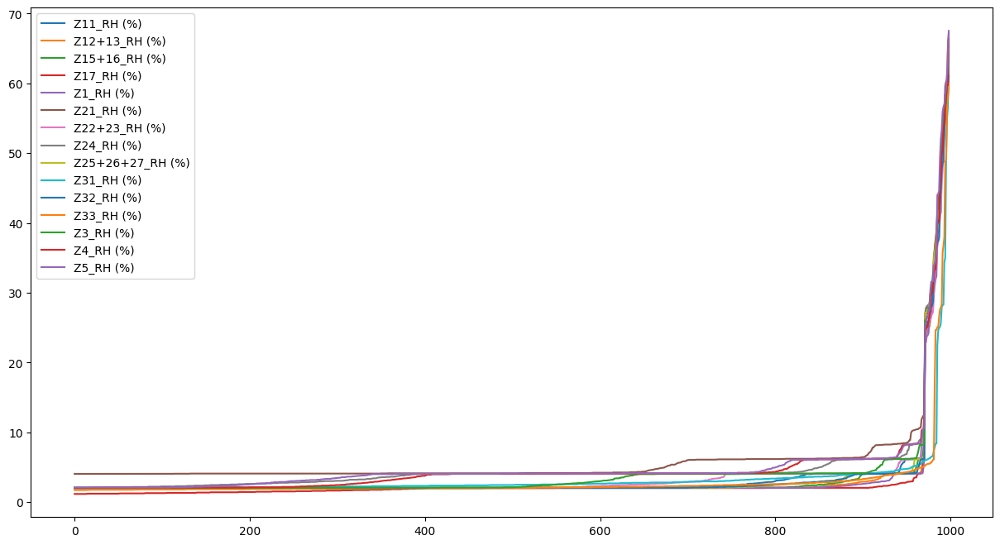

In [7]:
df.plot(figsize=(15, 8))

In [8]:
#Observe the .9 quantile (where 90% of the differences lie in)
df.quantile(0.9)

Z11_RH (%)          4.080002
Z12+13_RH (%)       2.884000
Z15+16_RH (%)       3.872000
Z17_RH (%)          2.040001
Z1_RH (%)           2.568001
Z21_RH (%)          6.408001
Z22+23_RH (%)       4.119999
Z24_RH (%)          6.120003
Z25+26+27_RH (%)    4.039997
Z31_RH (%)          4.040001
Z32_RH (%)          4.004000
Z33_RH (%)          3.243999
Z3_RH (%)           4.160000
Z4_RH (%)           6.200001
Z5_RH (%)           6.199997
Name: 0.9, dtype: float64

In [9]:
Lst_name = Zone_RH.columns.values

In [10]:
#If the absolute difference between consecutive values is greater than 5, drop them.
for i in range(len(Lst_name)):
    col_name = Lst_name[i]
    df = Zone_RH[col_name]
    # Drop rows where the difference exceeds 100
    to_drop = df[abs(df.diff()) > 5].index
    Zone_RH[col_name] = df.drop(to_drop)
    # Apply linear interpolation to fill gaps
    Zone_RH[col_name] = Zone_RH[col_name].interpolate()

<Axes: xlabel='Timestamp'>

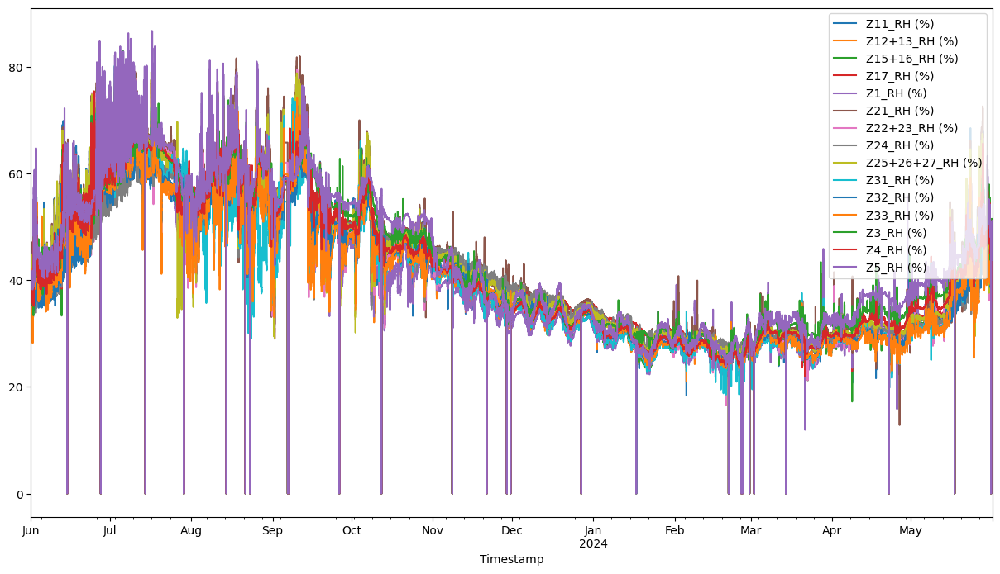

In [11]:
Zone_RH.plot(figsize=(15, 8))

<Axes: xlabel='Timestamp'>

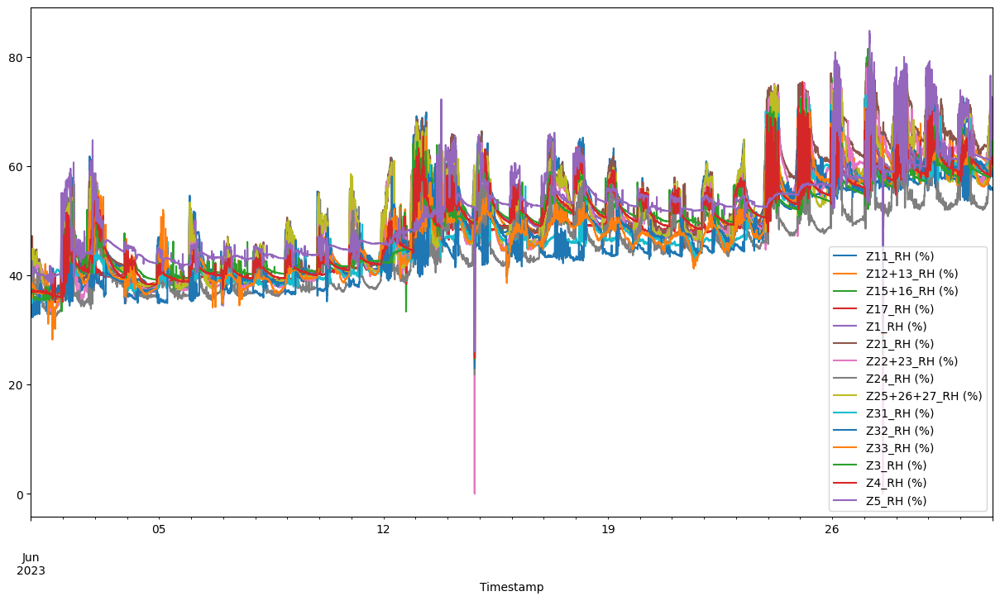

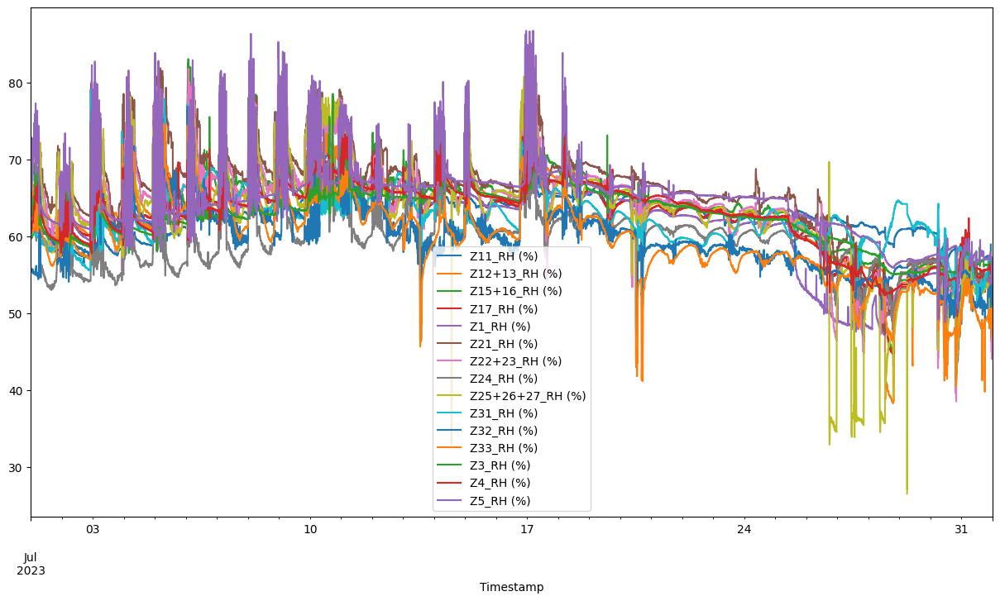

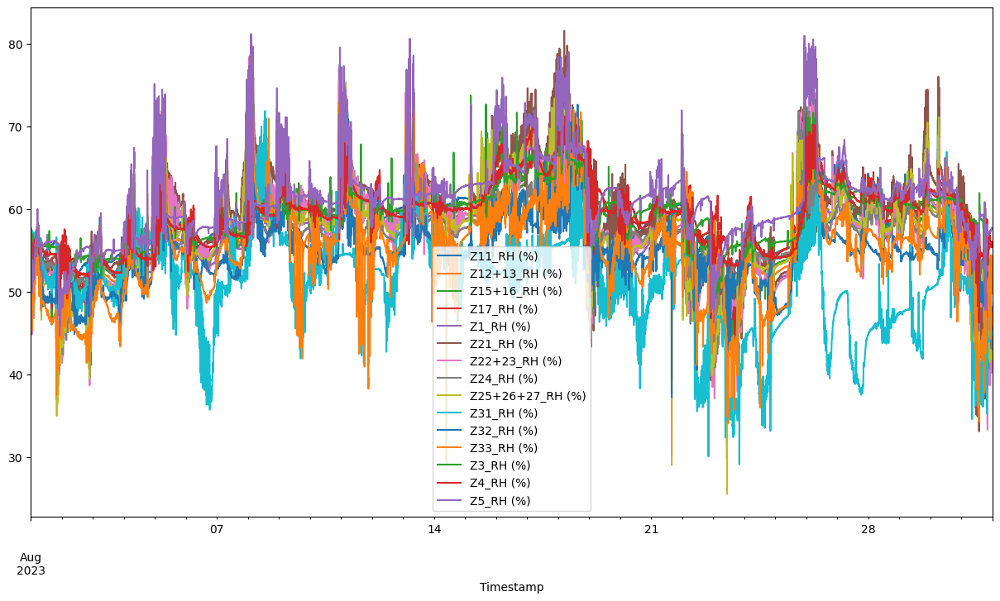

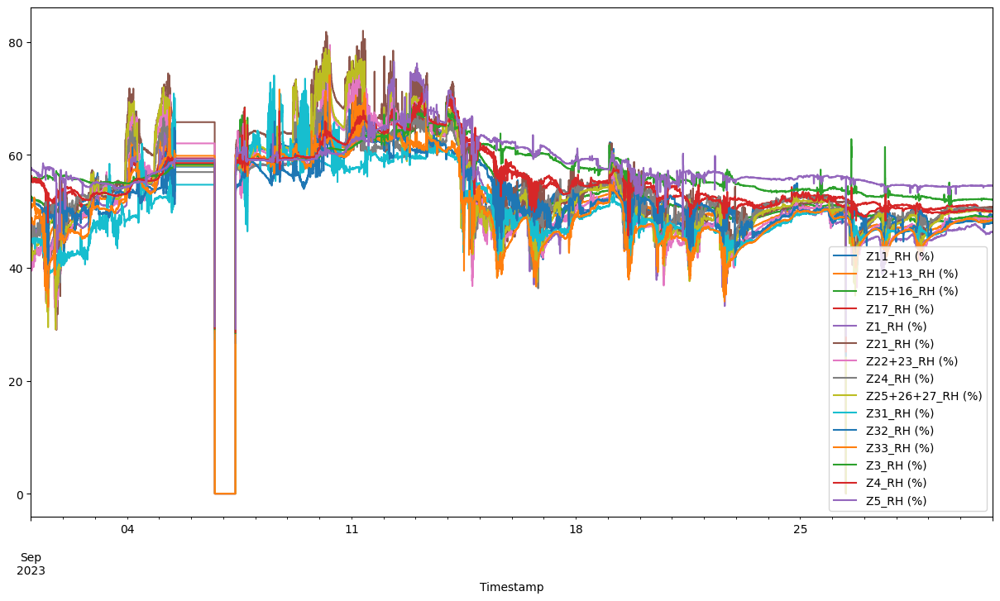

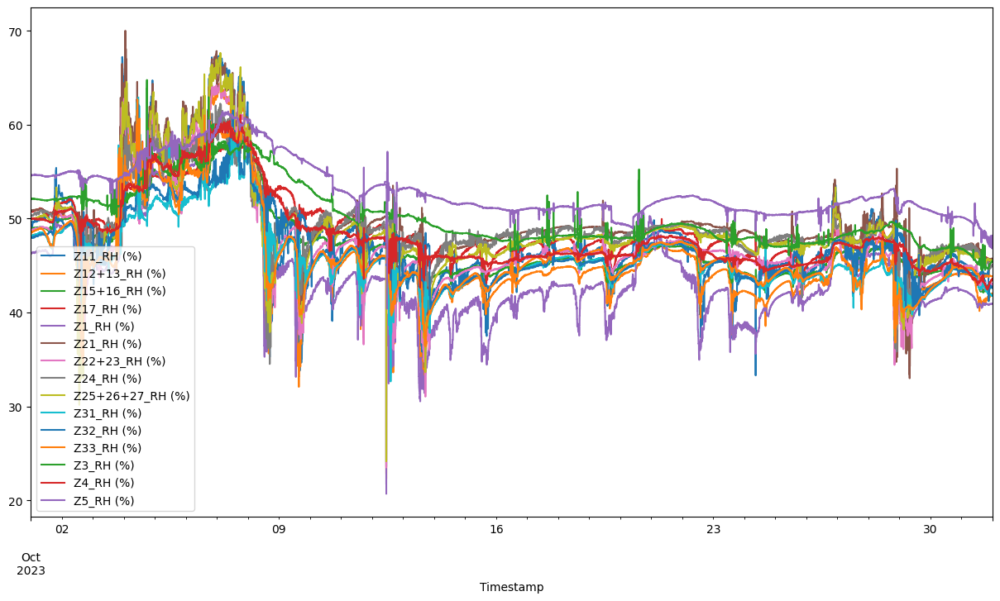

...

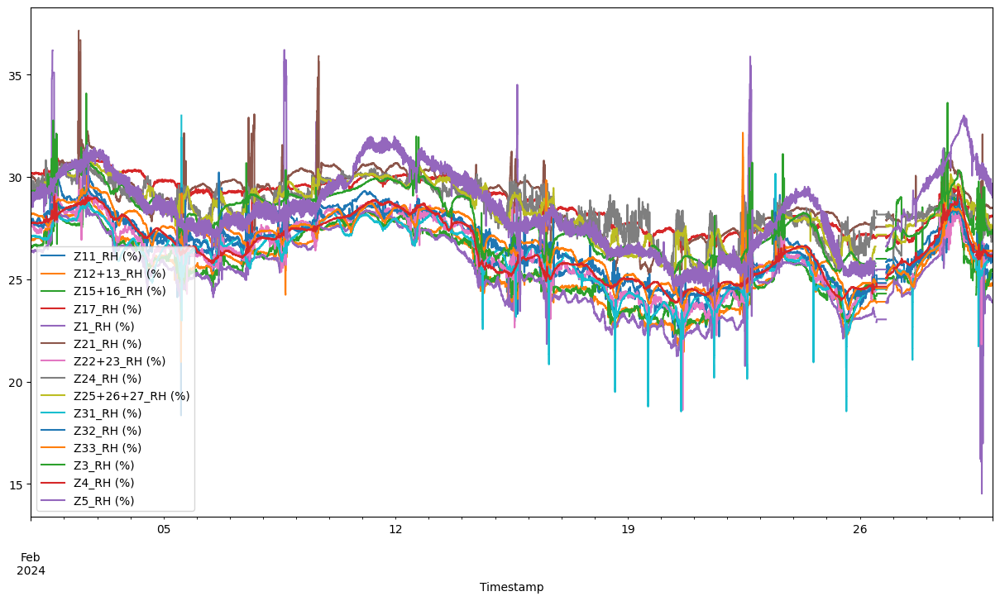

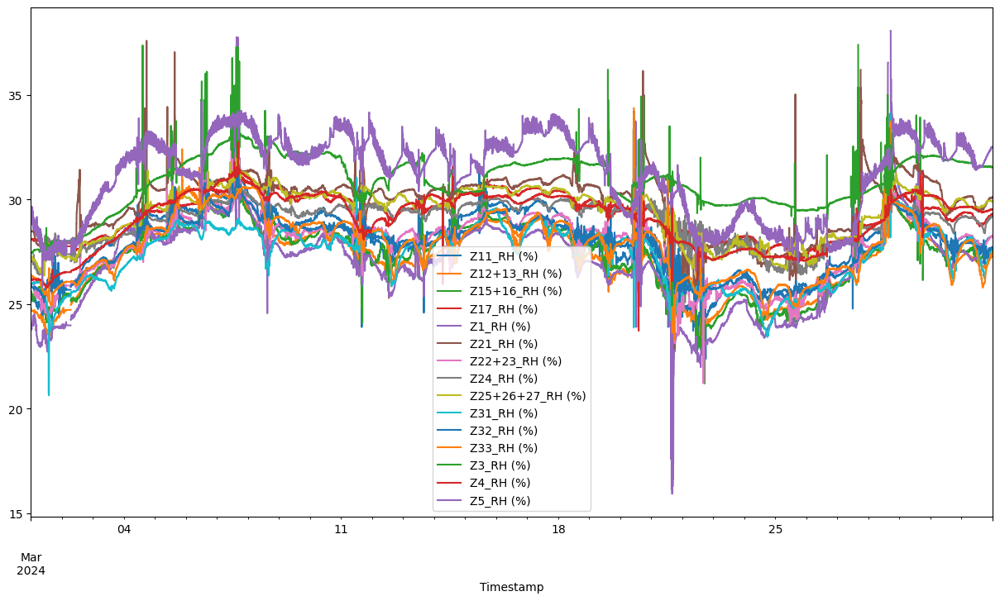

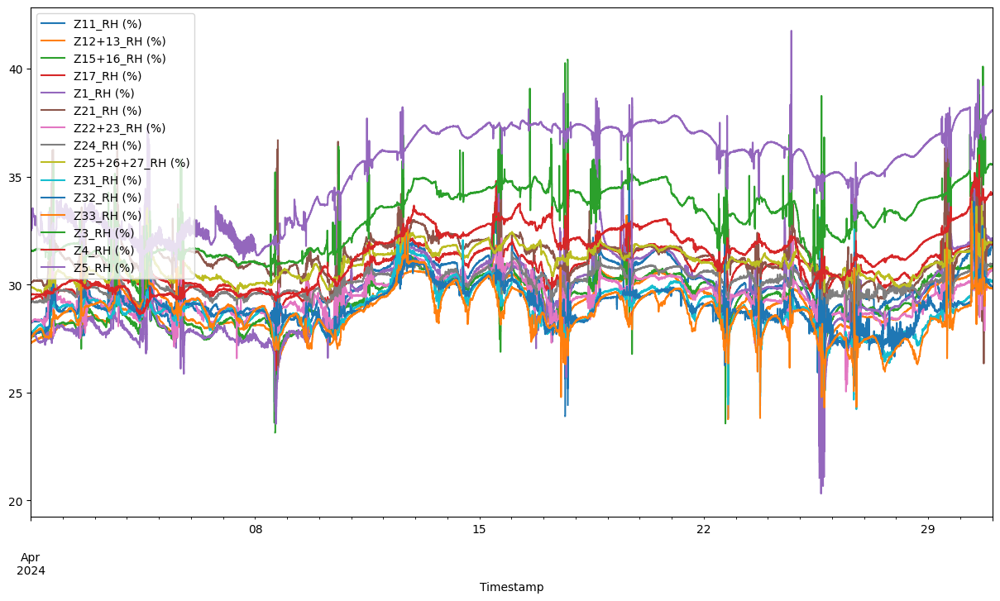

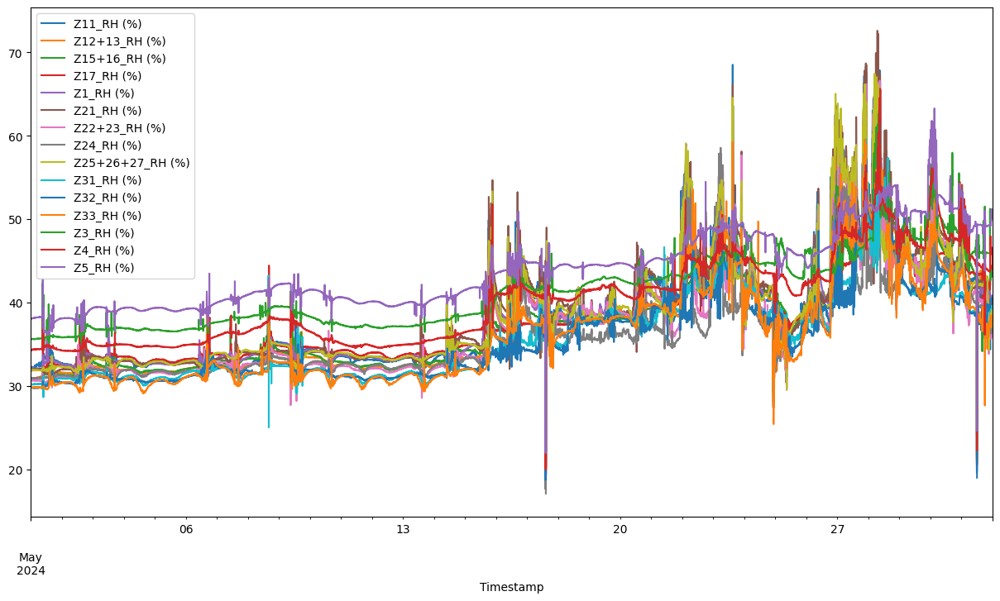

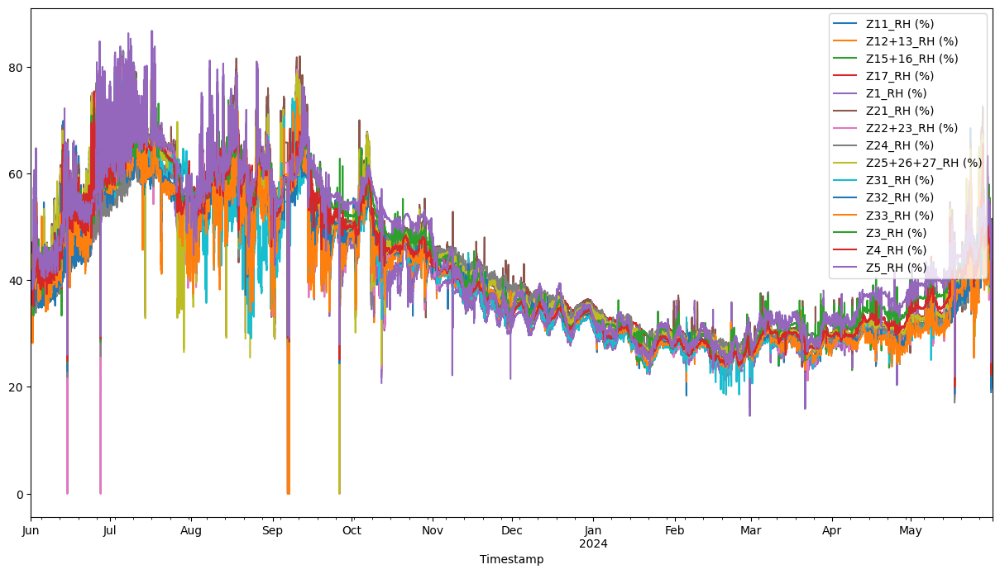

In [12]:
# Loop through each group defined by year and month
for (year, month), group in Zone_RH.groupby([Zone_RH.index.year, Zone_RH.index.month]):
    # Calculate the absolute Z-scores within this group
    z_scores = np.abs(zscore(group, nan_policy='omit'))  # nan_policy='omit' handles NaNs in data

    # Define a threshold (e.g., 3 standard deviations)
    threshold = 5

    # Replace data points that are outliers with np.nan within the group
    group[z_scores > threshold] = np.nan

    # You may want to assign this back to the main DataFrame if you need to preserve these changes
    Zone_RH.loc[group.index] = group

    # Plot each group
    group.plot(figsize=(15, 8))

# Optionally, plot the entire DataFrame after processing
Zone_RH.plot(figsize=(15, 8))

In [13]:
Zone_RH.describe()

,Z11_RH (%),Z12+13_RH (%),Z15+16_RH (%),Z17_RH (%),Z1_RH (%),Z21_RH (%),Z22+23_RH (%),Z24_RH (%),Z25+26+27_RH (%),Z31_RH (%),Z32_RH (%),Z33_RH (%),Z3_RH (%),Z4_RH (%),Z5_RH (%)
count,525822.000000,525930.000000,525891.000000,525888.000000,526546.000000,526661.000000,526878.000000,525923.000000,526875.000000,526056.000000,525875.000000,527023.000000,525917.000000,525933.000000,525926.000000
mean,41.496795,40.792679,41.176049,42.746470,40.174940,43.472875,41.235698,41.454508,42.368220,39.597162,40.349345,40.226396,43.169540,42.099304,44.392248
std,13.167054,13.545408,13.506622,12.424517,13.263911,13.625388,13.755891,11.497266,12.929199,12.022447,12.073796,12.181564,12.400655,12.924407,13.147723
min,18.350000,18.920000,19.230000,18.820000,0.000000,0.000000,0.000000,17.080000,0.000000,18.540001,18.740000,0.000000,20.980000,20.020000,21.519999
25%,29.680000,28.879999,29.100000,30.980000,28.840000,31.379999,29.280001,30.299999,30.920000,28.760000,29.180000,29.160000,31.799999,30.459999,32.580002
50%,37.799999,36.900002,37.779999,39.299999,35.820000,39.619999,37.680000,38.459999,38.980000,36.939999,37.419998,37.799999,39.860001,38.139999,40.939999
75%,52.639999,51.000000,51.360001,52.560001,50.599998,51.799999,50.320000,50.759998,51.040001,47.439999,50.240002,48.639999,54.959999,53.400002,55.959999
max,77.760002,79.440002,83.040001,77.919998,78.440002,82.000000,81.760002,78.239998,81.080002,79.040001,76.839996,75.839996,81.320000,79.680000,86.720001


In [14]:
Zone_RH[Zone_RH < 15] = np.nan

In [15]:
#Process to Hourly and forward fill (average to hour and forward fill to assign last existing value to a missing value)
Zone_RH = Zone_RH.resample("H").mean().ffill()

C:\Users\Sang\AppData\Local\Temp\ipykernel_25900\3694791778.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  Zone_RH = Zone_RH.resample("H").mean().ffill()


<Axes: xlabel='Timestamp'>

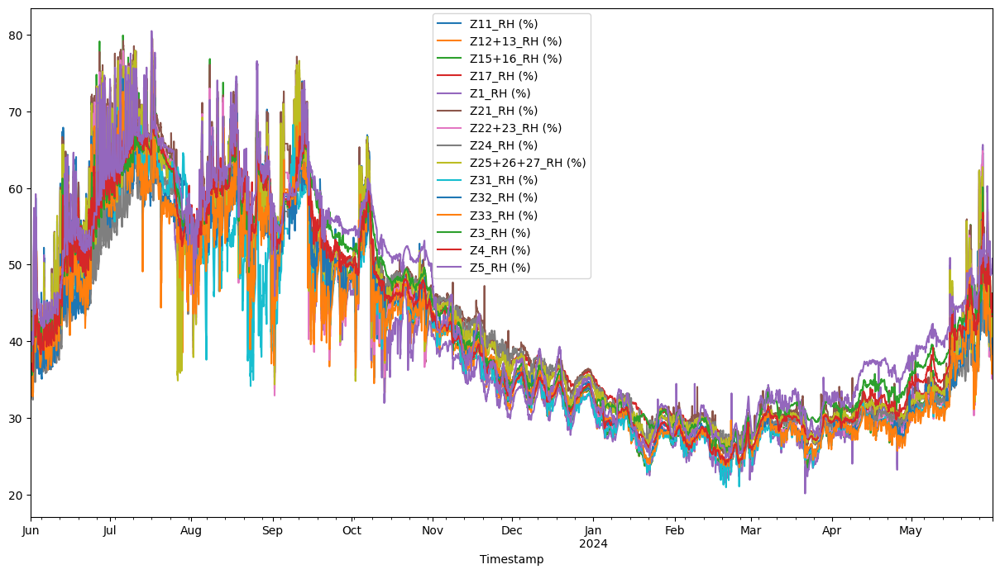

In [16]:
Zone_RH.plot(figsize=(15, 8))

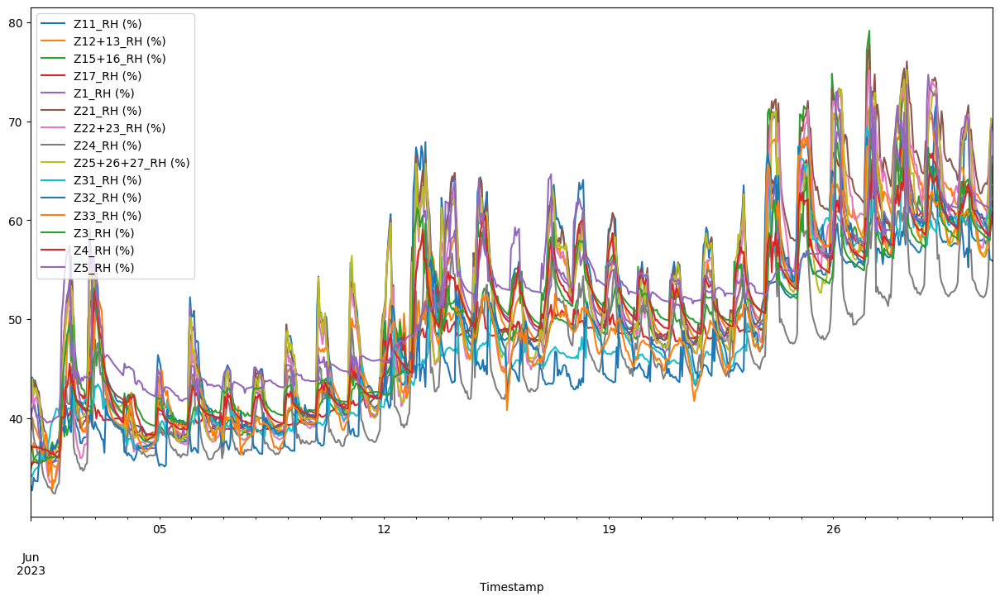

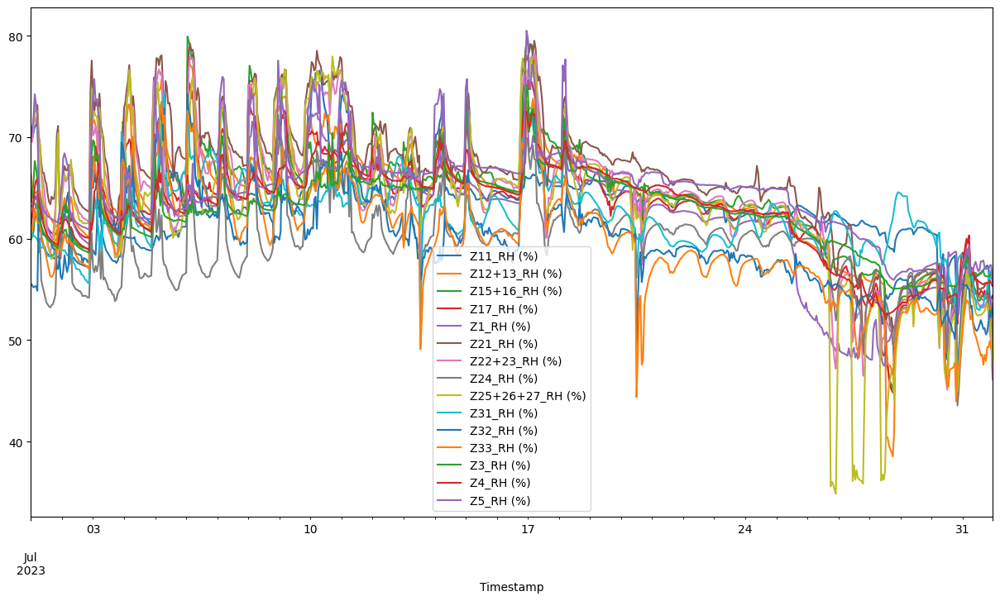

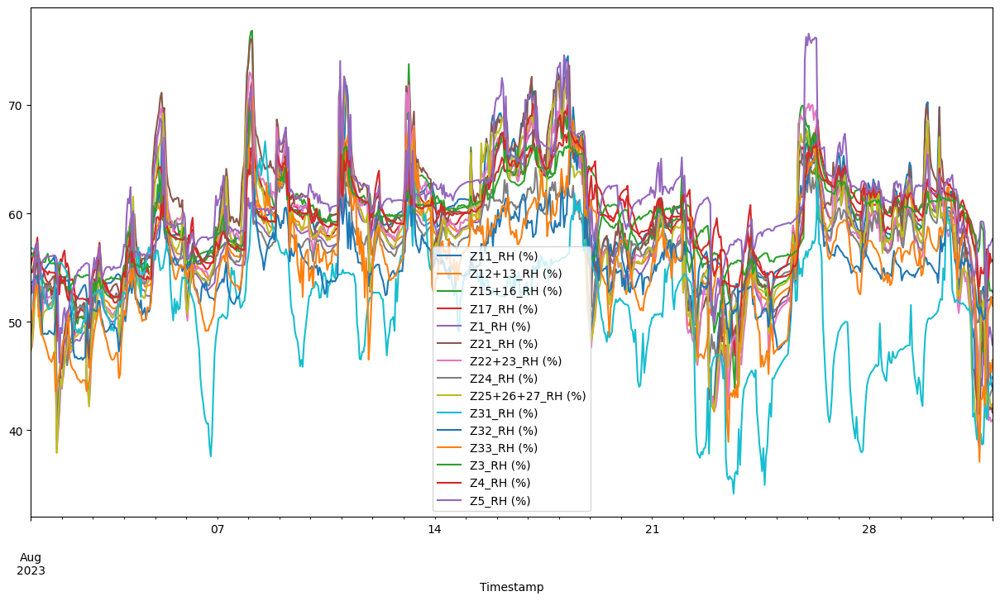

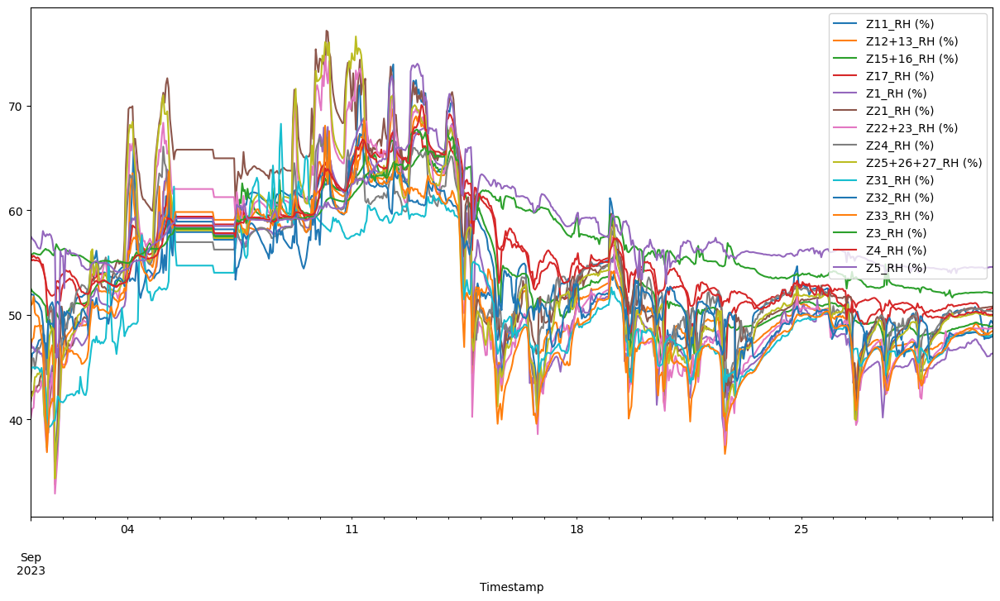

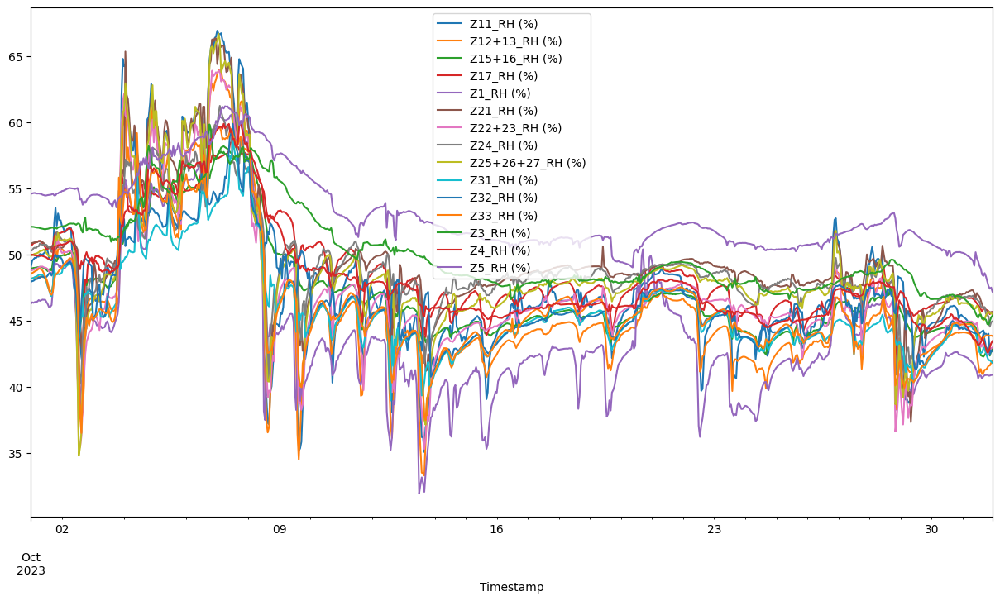

...

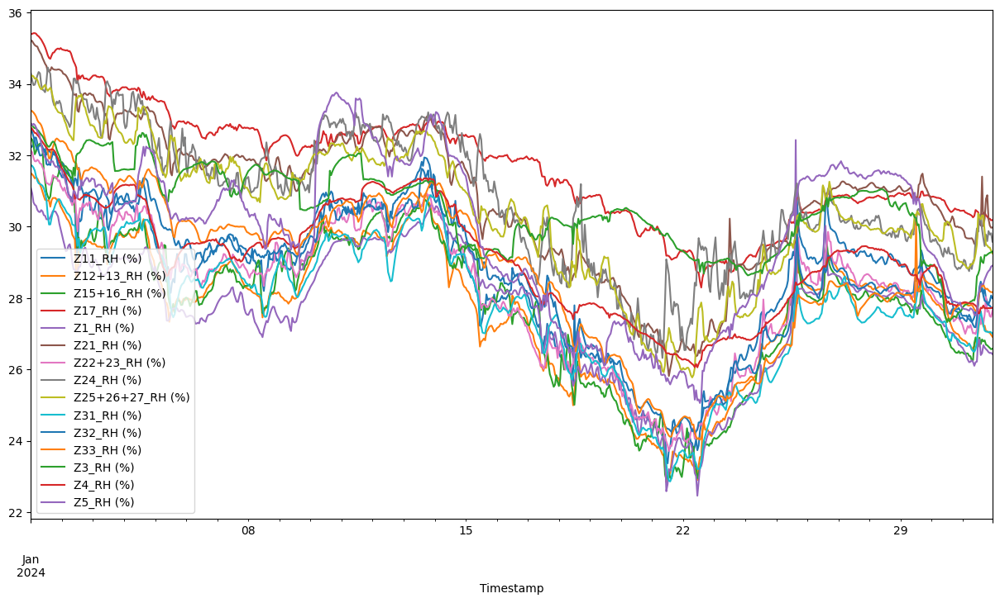

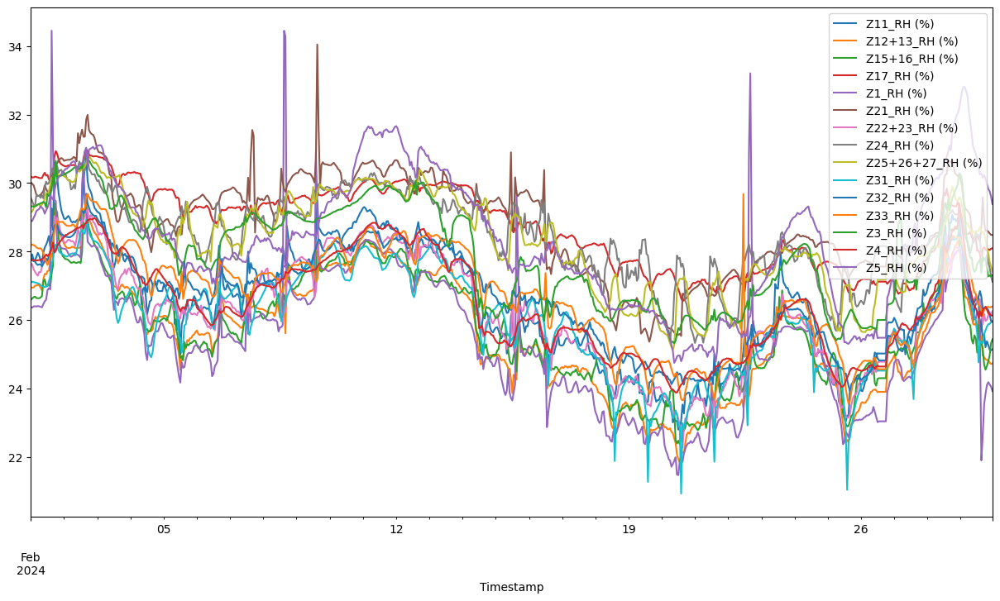

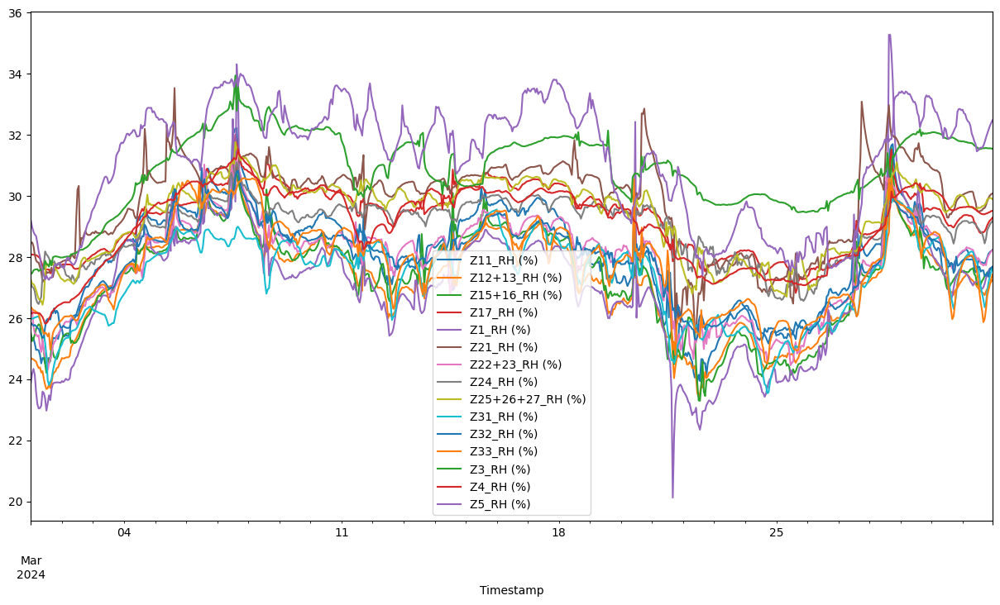

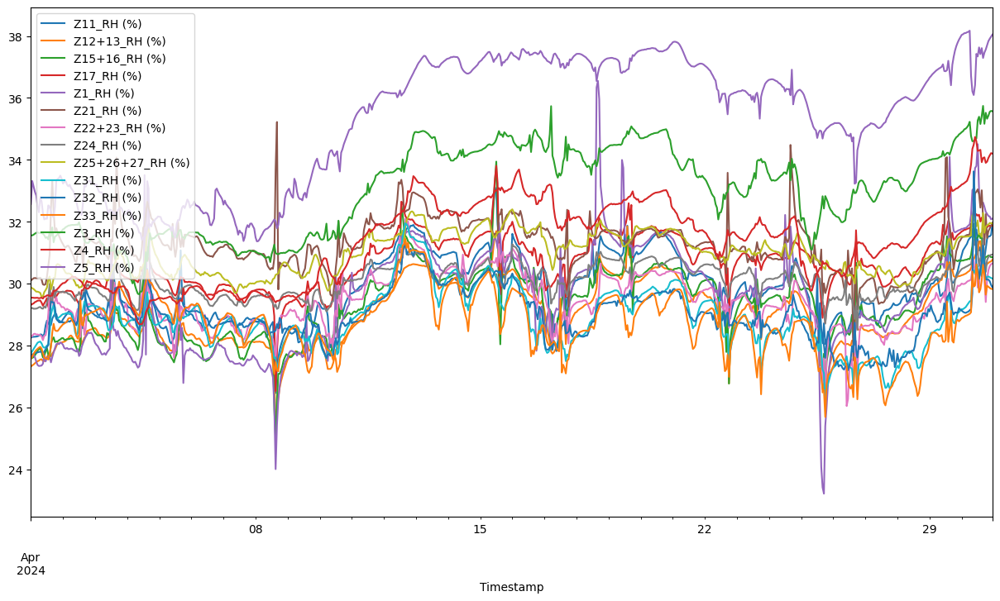

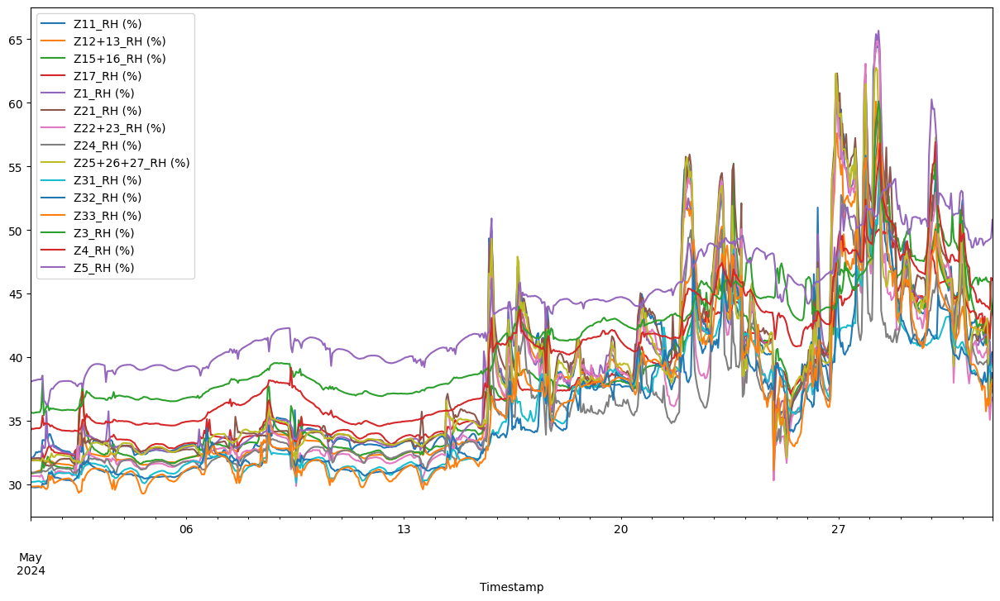

In [17]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in Zone_RH.groupby([Zone_RH.index.year, Zone_RH.index.month]):

    group.plot(figsize=(15, 8))

In [18]:
#Missing data check
# Detecting rows with repeated values
repeated_index = (Zone_RH.diff() == 0).all(axis=1)
repeated_rows = Zone_RH[repeated_index]

# Now let's get the index of the repeated rows
repeated_rows_index = repeated_rows.index.tolist()

Zone_RH[repeated_index] = np.nan

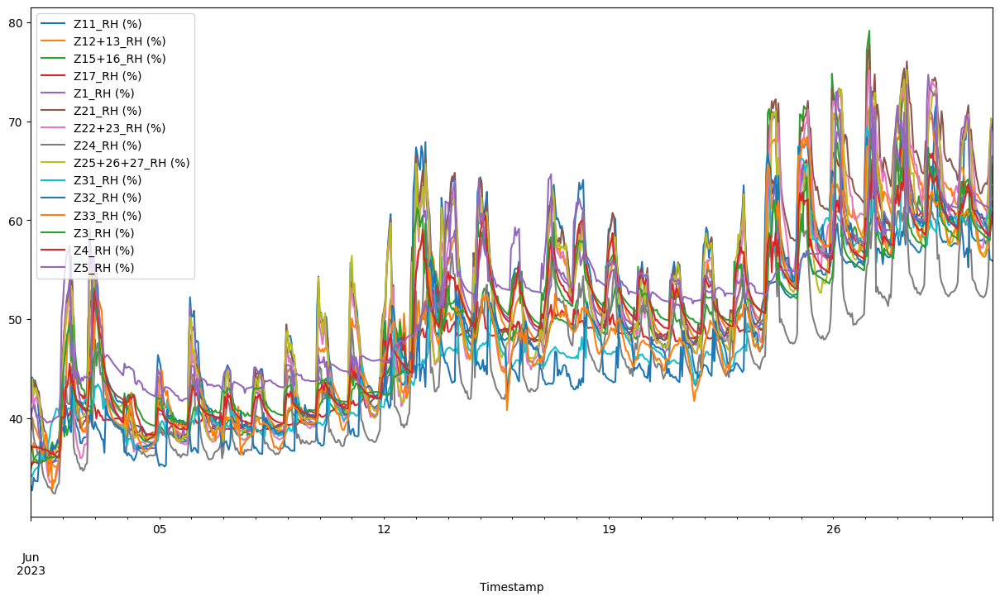

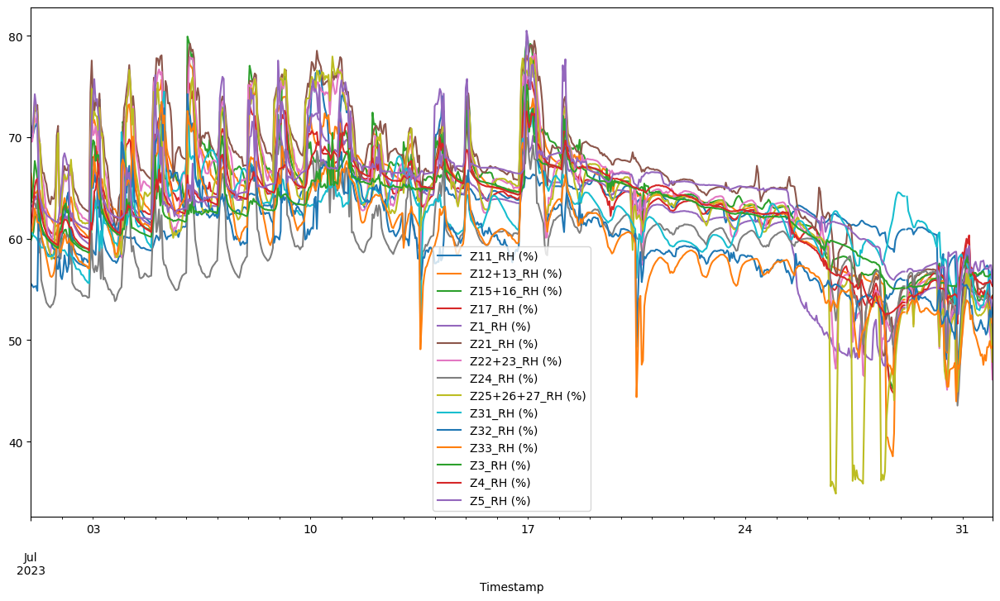

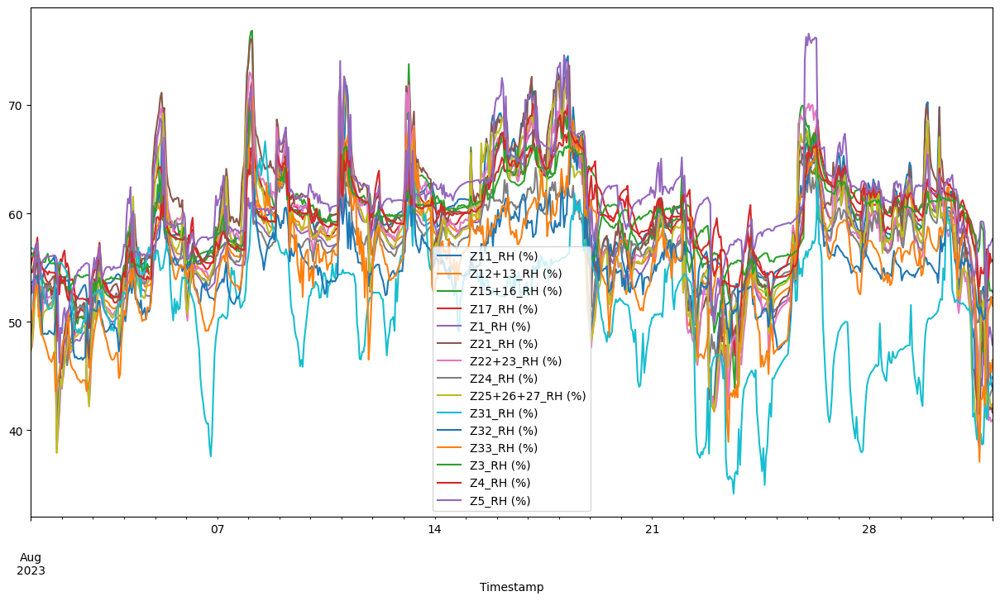

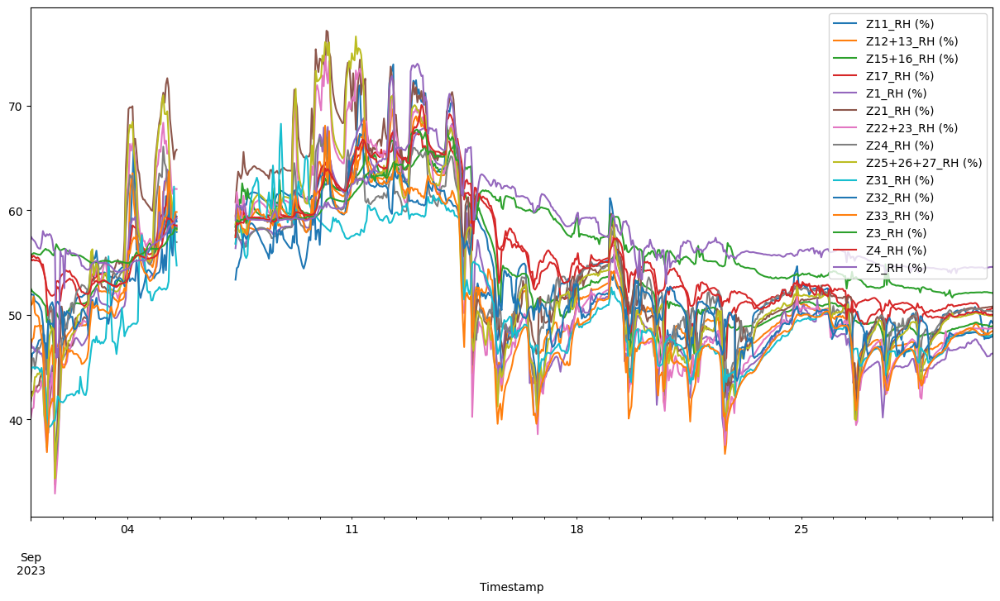

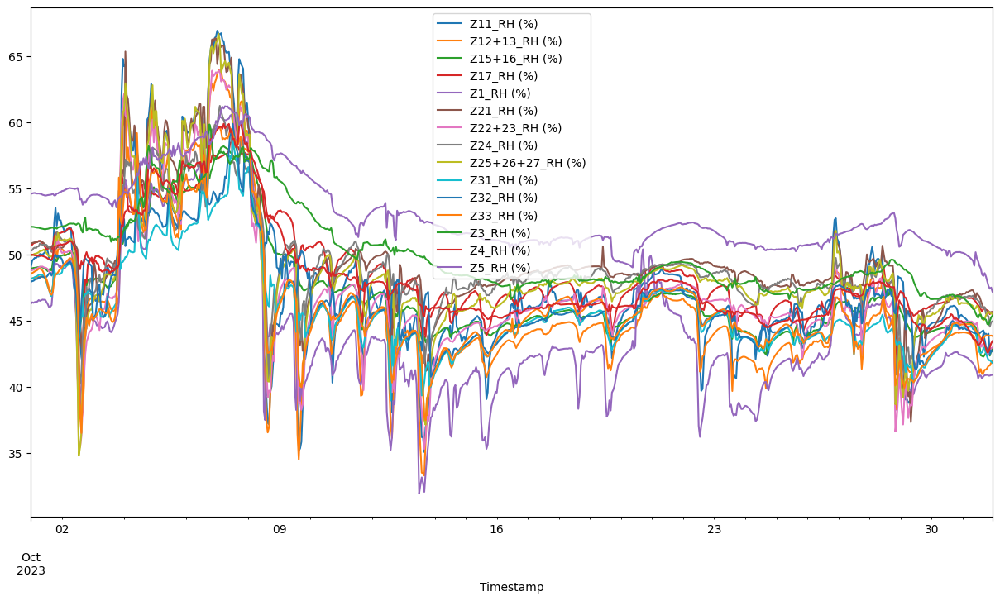

...

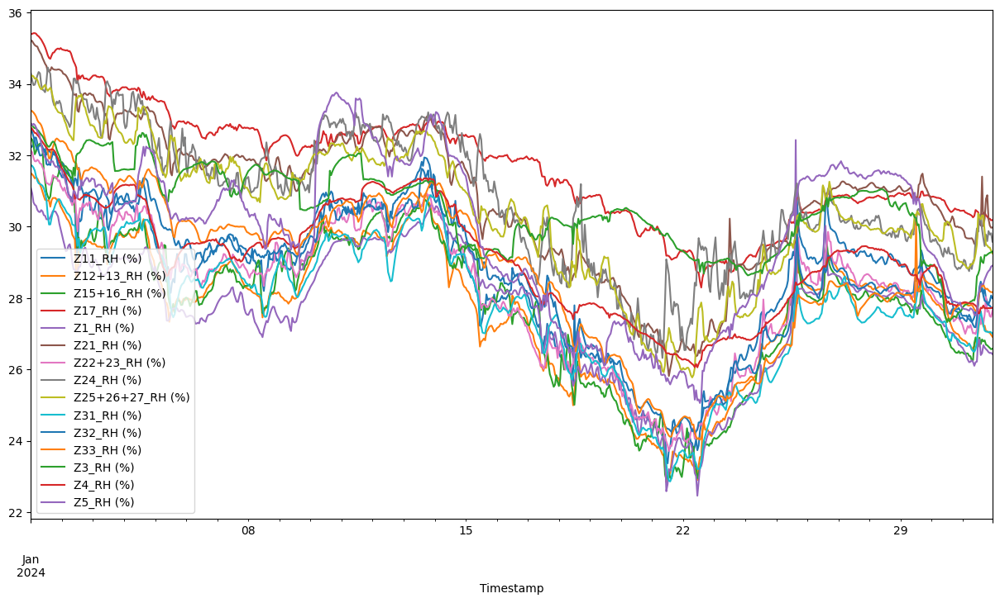

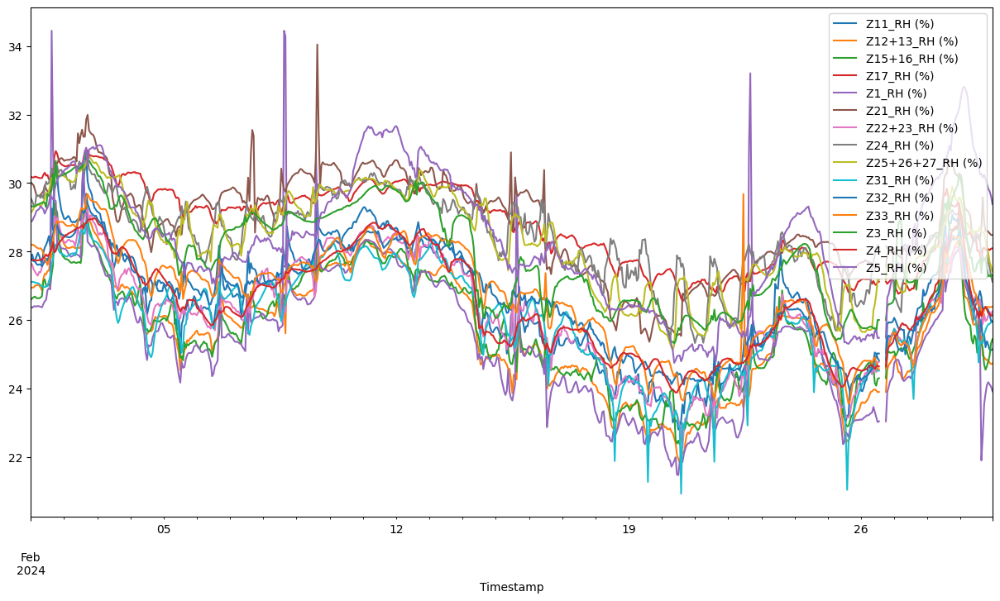

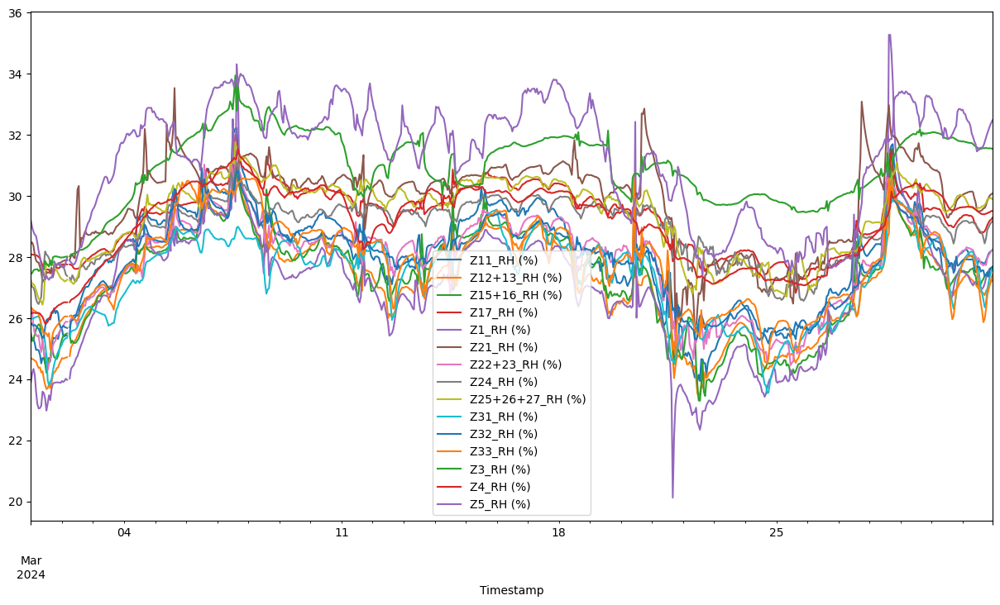

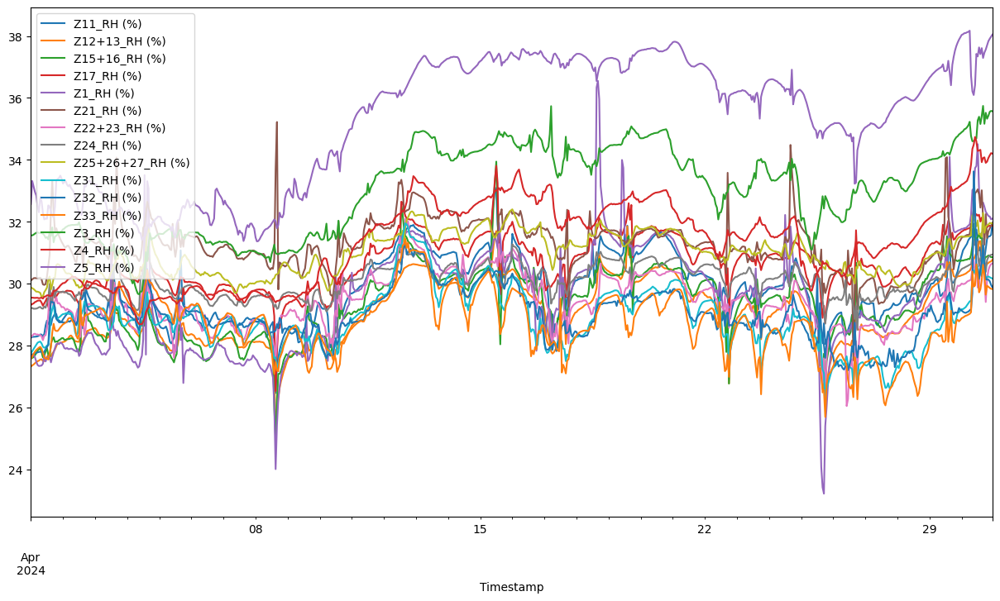

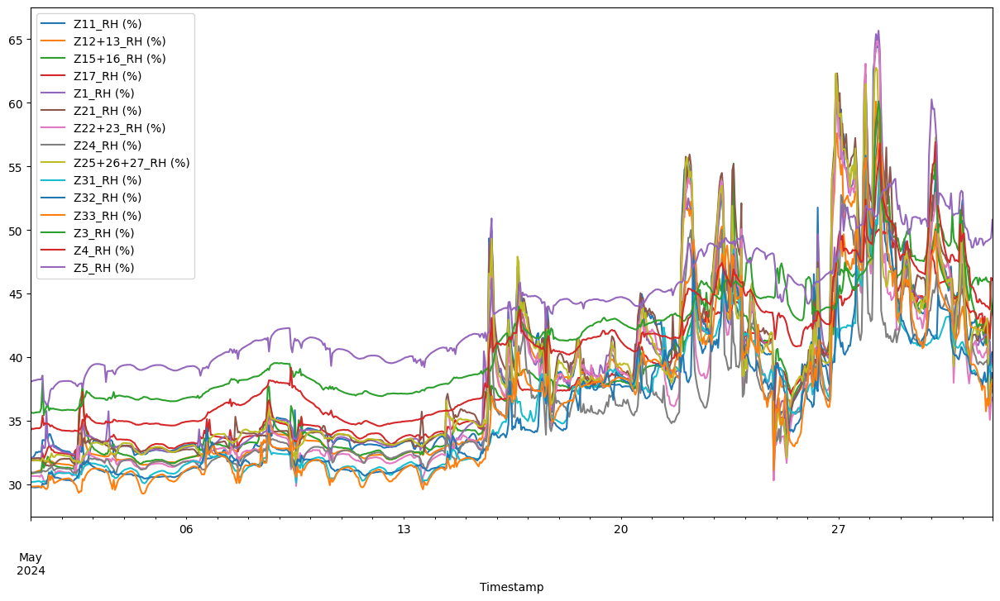

In [19]:
# Then, group by year and week number and apply Mahalanobis distance function
for (year, month), group in Zone_RH.groupby([Zone_RH.index.year, Zone_RH.index.month]):

    group.plot(figsize=(15, 8))

In [20]:
Zone_RH.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Processed\Desigo\Year4\Zone_RH_Year4.csv', index=True)

In [21]:
def find_nan_sequences(series):
    is_nan = series.isna()
    if is_nan.any():
        start = end = None
        for i, val in enumerate(is_nan):
            if val and start is None:
                start = i
            elif not val and start is not None:
                end = i - 1
                yield (series.index[start], series.index[end])
                start = end = None
        if start is not None:
            yield (series.index[start], series.index[-1])

# Find and print start and end indices of NaN sequences in each column
empDF = pd.DataFrame()
LstN = []
LstS = []
LstE = []

for column in Zone_RH.columns:
    for start, end in find_nan_sequences(Zone_RH[column]):
        print(f"Missing period:'{column}' from {start} to {end}")
        LstN.append(column)
        LstS.append(start)
        LstE.append(end)
        
empDF["names"] = LstN
empDF["start"] = LstS
empDF["end"] = LstE

Missing period:'Z11_RH (%)' from 2023-07-29 04:00:00-04:00 to 2023-07-29 04:00:00-04:00
Missing period:'Z11_RH (%)' from 2023-09-05 14:00:00-04:00 to 2023-09-06 16:00:00-04:00
Missing period:'Z11_RH (%)' from 2023-09-06 18:00:00-04:00 to 2023-09-07 08:00:00-04:00
Missing period:'Z11_RH (%)' from 2024-02-26 14:00:00-05:00 to 2024-02-26 17:00:00-05:00
Missing period:'Z11_RH (%)' from 2024-03-02 05:00:00-05:00 to 2024-03-02 05:00:00-05:00
Missing period:'Z12+13_RH (%)' from 2023-07-29 04:00:00-04:00 to 2023-07-29 04:00:00-04:00
Missing period:'Z12+13_RH (%)' from 2023-09-05 14:00:00-04:00 to 2023-09-06 16:00:00-04:00
Missing period:'Z12+13_RH (%)' from 2023-09-06 18:00:00-04:00 to 2023-09-07 08:00:00-04:00
Missing period:'Z12+13_RH (%)' from 2024-02-26 14:00:00-05:00 to 2024-02-26 17:00:00-05:00
Missing period:'Z12+13_RH (%)' from 2024-03-02 05:00:00-05:00 to 2024-03-02 05:00:00-05:00
Missing period:'Z15+16_RH (%)' from 2023-07-29 04:00:00-04:00 to 2023-07-29 04:00:00-04:00
Missing period

In [22]:
empDF.to_csv(r'C:\Users\Sang\OneDrive - Harvard University\CGBC\DataRelease\Final_Processing_Code_2024\Missing Intervals\Year4\Missing_periods_RH_Year4.csv', index=False)